In [2]:
from glob import glob
from numba import jit, njit
import numpy as np
import imageio
from skimage.util import view_as_blocks
import scipy as sp
import scipy.ndimage
from matplotlib import pyplot as plt
import seaborn as sns
from pcr import downsample_block

In [3]:
paths = glob("example_images/*")
imgs = []
for path in paths:
    img = imageio.imread(path) / 255
    if img.ndim == 3:
        img = img.mean(axis=-1)
    imgs.append(img.copy())

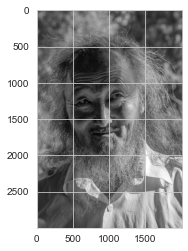

In [15]:
img = imageio.imread("example_images/05.jpg").mean(axis=-1)/255
# img = imageio.imread("example_target.png")/255
plt.imshow(img, cmap='gray', vmin=0, vmax=1)

In [16]:
scales = []
tmp = img.copy()
for scale in range(5):
    scales.append(tmp.copy())
    tmp = downsample_block(tmp, 1.4)
    #plt.imshow(tmp, cmap='gray', vmin=0, vmax=1)
    #plt.show()

In [9]:
max_dist = 4
min_samples = 20
contrast_k = 100
light_k = 100
contrasts = np.linspace(0, 1, contrast_k)
lights = np.linspace(0, 1, light_k)

In [10]:
Y, X = img.shape

In [11]:
def get_contrast_histogram(img, max_dist=8, contrast_k=100, light_k=100):
    contrasts = np.linspace(0, 1, contrast_k)
    lights = np.linspace(0, 1, light_k)
    histogram = np.zeros((contrast_k, light_k), int)
    dists = ([(x, y) for x in range(max_dist+1) for y in range(max_dist+1) if (x or y) and (x**2 + y**2 <= max_dist**2)])
    _fill_histogram(img, histogram, dists, max_dist, contrast_k, light_k)
    return histogram

@njit
def _fill_histogram(img, histogram, dists, max_dist, contrast_k, light_k):
    Y, X = img.shape
    for y in range(Y):
        for x in range(X):
            intensity = img[y, x]
            for dy, dx in dists:
                yy, xx = y+dy, x+dx
                if yy>=Y or xx>=X:
                    continue
                v0 = img[y, x]
                v1 = img[y+dy, x+dx]
                intensity = (v0 + v1) / 2
                intensity_bin = int(np.round(intensity*light_k))
                contrast = np.abs(v0 - v1)
                contrast_bin = int(np.round(contrast*contrast_k))
                histogram[contrast_bin, intensity_bin] += 1
    return histogram


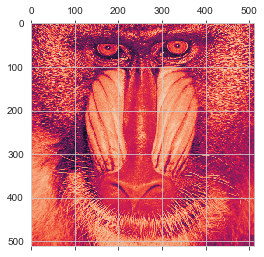

In [13]:
plt.matshow(img)

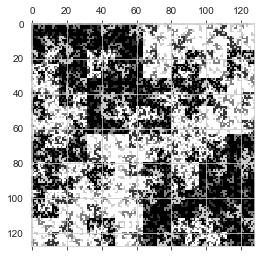

C:\ProgramData\Miniconda3\envs\test-target-metrics\lib\site-packages\numba\core\ir_utils.py:2152: NumbaPendingDeprecationWarning: 
Encountered the use of a type that is scheduled for deprecation: type 'reflected list' found for argument 'dists' of function '_fill_histogram'.

For more information visit https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-reflection-for-list-and-set-types

File "..\..\..\..\AppData\Local\Temp\ipykernel_10696\3043044267.py", line 9:
<source missing, REPL/exec in use?>

  warnings.warn(NumbaPendingDeprecationWarning(msg, loc=loc))
C:\Users\feanolwe\AppData\Local\Temp\ipykernel_10696\1949771511.py:10: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


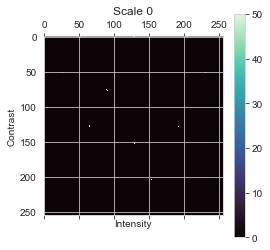

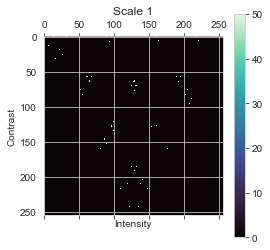

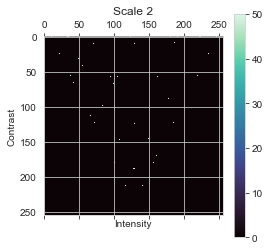

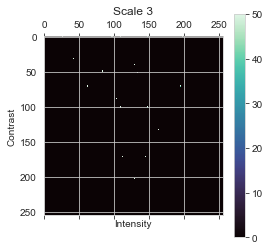

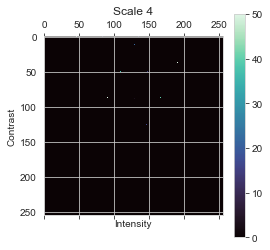

...

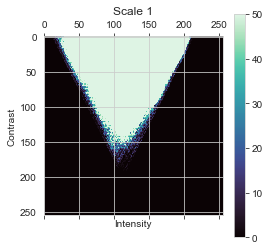

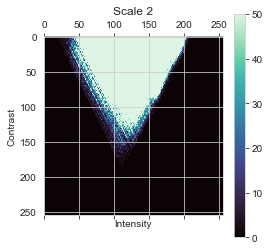

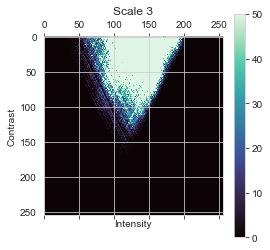

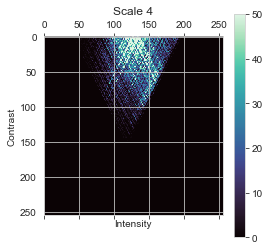

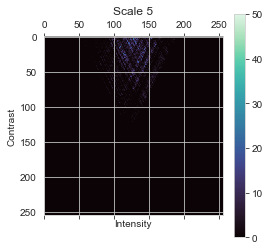

In [12]:
for img in imgs:
    # fig = plt.figure(figsize=(3,3))
    plt.matshow(img, cmap="gray", vmin=0, vmax=1)
    plt.show()
    tmp = img.copy()
    scale = 0
    while min(*tmp.shape)>=8 and scale<6:
        hist = get_contrast_histogram(tmp, max_dist=20, light_k=255, contrast_k=255)
        plt.matshow(hist, vmin=0, vmax=50, cmap="mako")
        plt.colorbar()
        plt.xlabel("Intensity")
        plt.ylabel("Contrast")
        plt.title(f"Scale {scale}")
        Y, X = tmp.shape
        tmp = tmp[:Y-Y%2, :X-X%2]
        tmp = downsample_block(tmp)
        plt.show()
        scale += 1

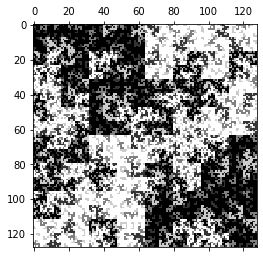

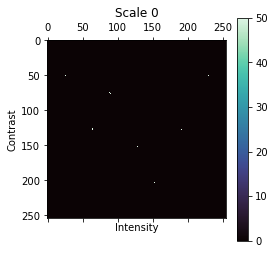

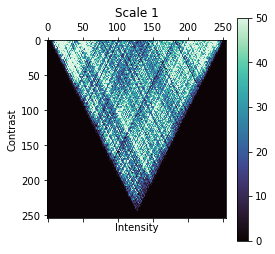

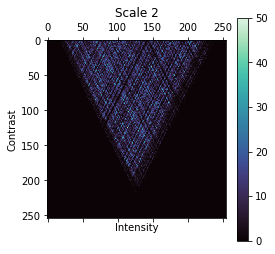

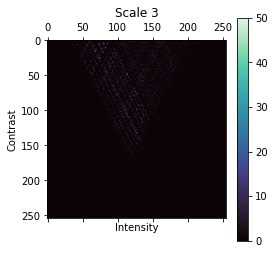

...

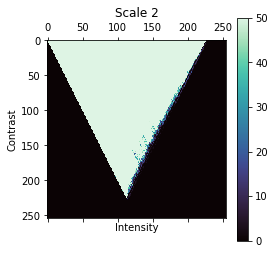

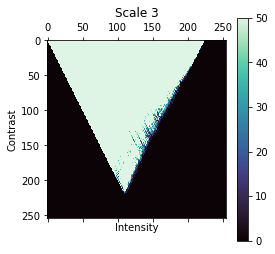

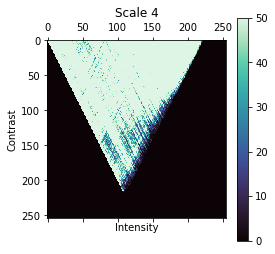

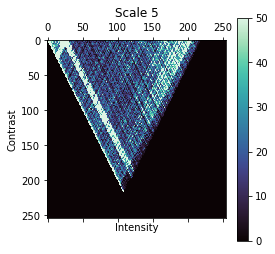

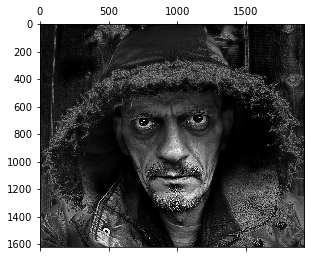

KeyboardInterrupt: 

In [94]:
for img in imgs:
    # fig = plt.figure(figsize=(3,3))
    plt.matshow(img, cmap="gray", vmin=0, vmax=1)
    plt.show()
    tmp = img.copy()
    scale = 0
    while min(*tmp.shape)>=8 and scale<6:
        hist = get_contrast_histogram(tmp, max_dist=20, light_k=255, contrast_k=255)
        plt.matshow(hist, vmin=0, vmax=50, cmap="mako")
        plt.colorbar()
        plt.xlabel("Intensity")
        plt.ylabel("Contrast")
        plt.title(f"Scale {scale}")
        Y, X = tmp.shape
        tmp = tmp[:Y-Y%2, :X-X%2]
        tmp = downsample_block(tmp, 1.4)
        plt.show()
        scale += 1

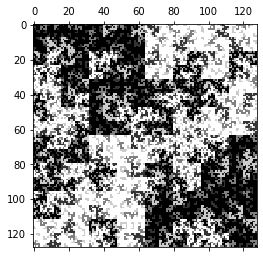

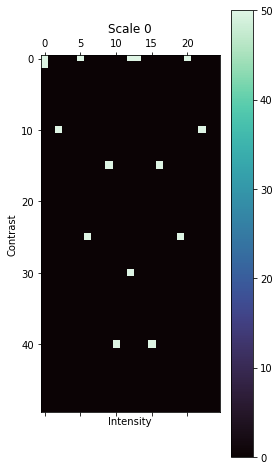

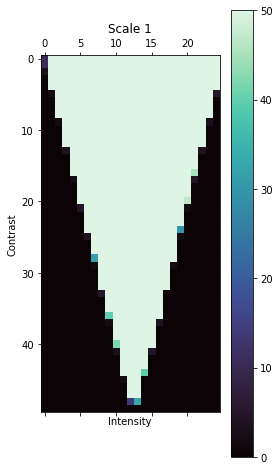

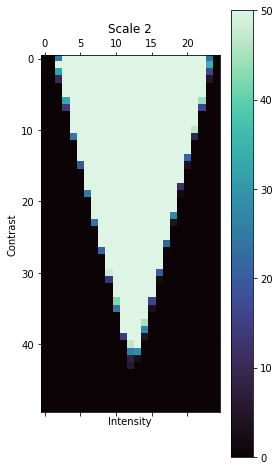

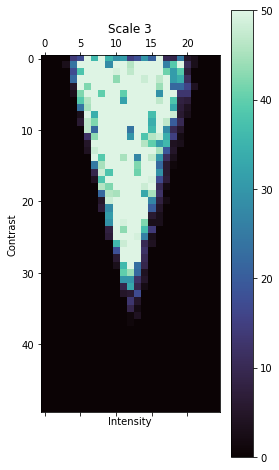

...

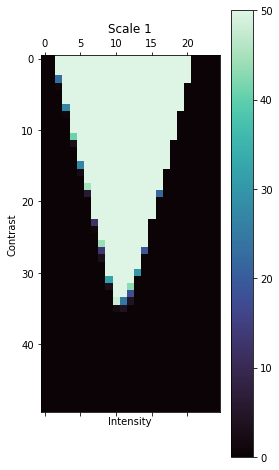

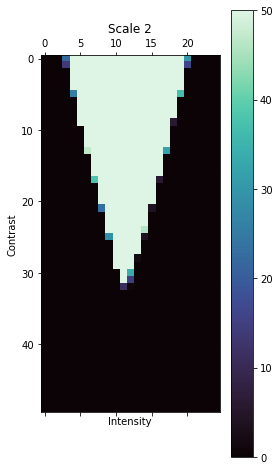

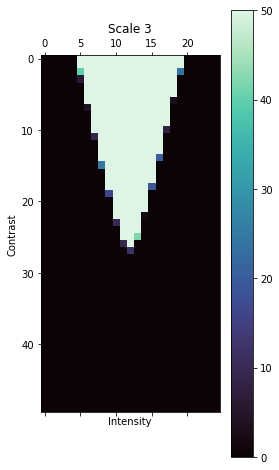

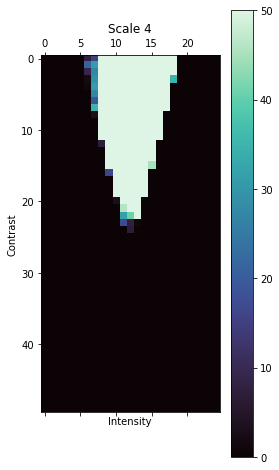

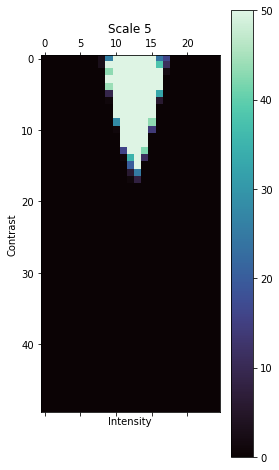

In [106]:
for img in imgs:
    plt.matshow(img, cmap="gray", vmin=0, vmax=1)
    plt.show()
    tmp = img.copy()
    scale = 0
    while min(*tmp.shape)>=8 and scale<6:
        hist = get_contrast_histogram(tmp, max_dist=20, light_k=25, contrast_k=50)
        plt.matshow(hist, vmin=0, vmax=50, cmap="mako")
        plt.colorbar()
        plt.xlabel("Intensity")
        plt.ylabel("Contrast")
        plt.title(f"Scale {scale}")
        Y, X = tmp.shape
        tmp = tmp[:Y-Y%2, :X-X%2]
        tmp = downsample_block(tmp, 1.4)
        plt.show()
        scale += 1

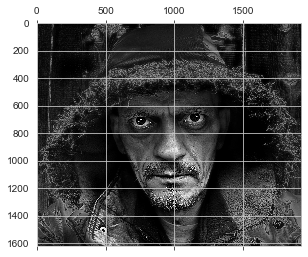

C:\Users\feanolwe\AppData\Local\Temp\ipykernel_10696\4223559519.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


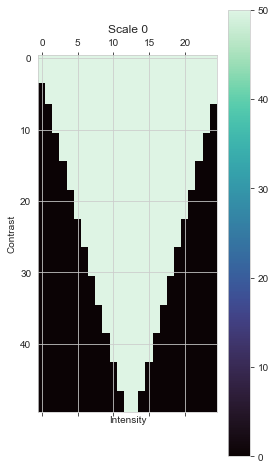

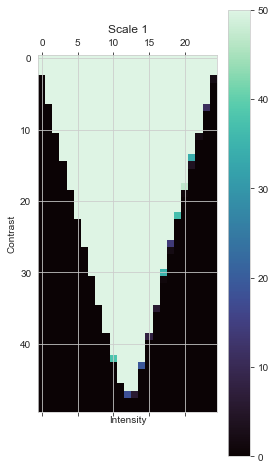

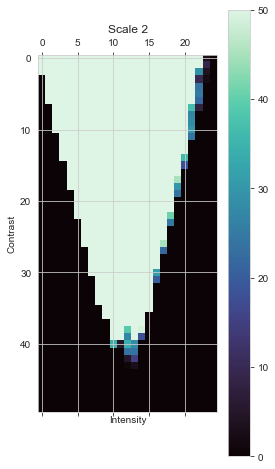

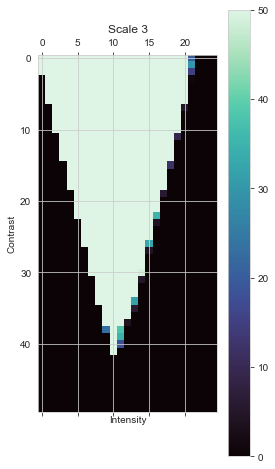

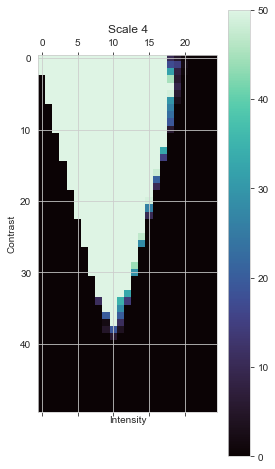

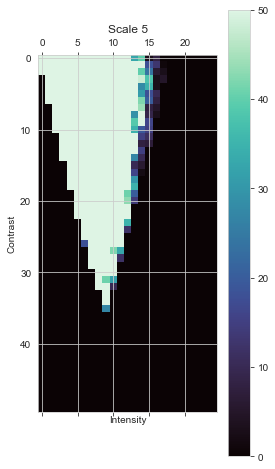

In [25]:
img = imgs[10]
plt.matshow(img, cmap="gray", vmin=0, vmax=1)
plt.show()
tmp = img.copy()
scale = 0
hists = []
while min(*tmp.shape) >= 8 and scale < 6:
    hist = get_contrast_histogram(tmp, max_dist=20, light_k=25, contrast_k=50)
    hists.append(hist)
    plt.matshow(hist, vmin=0, vmax=50, cmap="mako")
    plt.colorbar()
    plt.xlabel("Intensity")
    plt.ylabel("Contrast")
    plt.title(f"Scale {scale}")
    Y, X = tmp.shape
    tmp = tmp[:Y - Y % 2, :X - X % 2]
    tmp = downsample_block(tmp, 1.4)
    plt.show()
    scale += 1

In [17]:
sns.displot(penguins, x="bill_length_mm", y="bill_depth_mm", binwidth=(2, .5), cbar=True)

In [21]:
yy, xx = np.meshgrid(np.arange(-128, 128), np.arange(-128, 128))

In [23]:
a = yy**2 + xx**2 <= 128**2
imageio.imsave("../l1.png", a.astype(np.uint8)*255)